# Exploratory Data Analysis (EDA)

## Load extended packages

In [1]:
#data science packages
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif, f_regression, mutual_info_regression

#visualisation packages
import plotly.io as pio
import plotly.graph_objects as go
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colorbar as mcb
import seaborn as sns
from plotly.subplots import make_subplots
from scipy.stats import gaussian_kde

# time-series packages
from datetime import datetime
from scipy.interpolate import interp1d
from sklearn.metrics import mean_squared_error
import random
from statsmodels.tsa.arima.model import ARIMA
from statsmodels import robust
from numpy import polyfit, poly1d
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer


## Load datasets

In [2]:
air_df = pd.read_csv('../778project/wellington_data.csv')
air_df

,Date,Daily Average NO2 (ug/m3),Daily Average O3 (ug/m3),Daily Average CO (mg/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),GustSpd(m/s),...,ET10(C),ET20(C),ET30(C),ET100(C),Pmsl(hPa),Pstn(hPa),Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount
0,2020-01-01,3.658625,14.330667,0.092625,6.977292,13.236917,17,1.4,349,12.9,...,17.7,18.3,-,17.2,1016.2,1010.3,10.9,26.36,5781.687215,150.940860
1,2020-01-02,2.655652,16.340000,0.072783,4.804792,12.657875,41,3.0,353,13.9,...,17.4,18.4,-,17.3,1012.0,1006.1,7.7,20.33,6950.922374,253.946237
2,2020-01-03,8.100958,21.569625,0.167917,15.910583,25.593458,6,2.3,1,10.3,...,19.0,19.4,-,17.4,1002.8,996.9,8.5,23.23,6615.646119,202.112903
3,2020-01-04,3.720917,16.547500,0.059667,5.838958,13.041375,234,1.8,274,9.8,...,17.8,19.0,-,17.4,1005.0,999.1,12.3,28.73,5786.146119,156.989247
4,2020-01-05,4.783000,14.739042,0.061435,3.038708,17.067042,27,1.1,291,21.1,...,17.1,18.5,-,17.5,1007.2,1001.2,0.1,5.59,7279.936019,305.158824
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,2023-12-27,1.026500,13.433750,0.065217,3.707833,10.000739,158,2.3,120,9.3,...,19.8,19.7,-,17.2,1022.4,1016.4,9.5,26.91,5320.722222,243.851852
1457,2023-12-28,5.349417,13.960708,0.111609,3.249250,5.964792,59,2.0,269,7.7,...,18.9,17.8,-,17.4,1021.6,1015.6,8.4,22.95,5175.287037,276.546296
1458,2023-12-29,2.499875,15.247458,0.160783,2.030875,6.317250,21,4.9,332,16.5,...,19.9,20.2,-,17.5,1008.0,1002.1,1.1,12.95,4556.462963,226.981481
1459,2023-12-30,0.319875,25.080958,0.127696,7.378208,15.679583,339,6.6,323,16.5,...,19.2,19.5,-,17.6,1006.9,1001.0,6.3,19.25,4510.509259,164.712963


In [3]:
air_df['Date'] = pd.to_datetime(air_df['Date'])
air_df.dtypes

Date                           datetime64[ns]
Daily Average NO2 (ug/m3)             float64
Daily Average O3 (ug/m3)              float64
Daily Average CO (mg/m3)              float64
Daily Average PM2.5 (ug/m3)           float64
Daily Average PM10 (ug/m3)            float64
WDir(Deg)                              object
WSpd(m/s)                              object
GustDir(Deg)                           object
GustSpd(m/s)                           object
WindRun(Km)                            object
Rain(mm)                              float64
Tdry(C)                                object
TWet(C)                                object
RH(%)                                  object
Tmax(C)                                object
Tmin(C)                                object
Tgmin(C)                               object
ET05(C)                                object
ET10(C)                                object
ET20(C)                                object
ET30(C)                           

In [4]:
cols = ['WDir(Deg)', 'WSpd(m/s)', 'GustDir(Deg)', 'GustSpd(m/s)', 'WindRun(Km)','Tdry(C)', 'TWet(C)', 'RH(%)', 'Tmax(C)', 'Tmin(C)', 'Tgmin(C)', 'ET05(C)', 'ET10(C)', 'ET20(C)', 'ET30(C)', 'ET100(C)', 'Pmsl(hPa)', 'Pstn(hPa)', 'Sun(Hrs)', 'Rad(MJ/m2)']
air_df[cols] = air_df[cols].replace('-', np.nan).astype(float)
air_df[cols] = air_df[cols].astype('float64')
air_df.dtypes

Date                           datetime64[ns]
Daily Average NO2 (ug/m3)             float64
Daily Average O3 (ug/m3)              float64
Daily Average CO (mg/m3)              float64
Daily Average PM2.5 (ug/m3)           float64
Daily Average PM10 (ug/m3)            float64
WDir(Deg)                             float64
WSpd(m/s)                             float64
GustDir(Deg)                          float64
GustSpd(m/s)                          float64
WindRun(Km)                           float64
Rain(mm)                              float64
Tdry(C)                               float64
TWet(C)                               float64
RH(%)                                 float64
Tmax(C)                               float64
Tmin(C)                               float64
Tgmin(C)                              float64
ET05(C)                               float64
ET10(C)                               float64
ET20(C)                               float64
ET30(C)                           

In [5]:
air_df.describe()

,Date,Daily Average NO2 (ug/m3),Daily Average O3 (ug/m3),Daily Average CO (mg/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),GustSpd(m/s),...,ET10(C),ET20(C),ET30(C),ET100(C),Pmsl(hPa),Pstn(hPa),Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount
count,1461,1451.000000,1459.000000,1459.000000,1458.000000,1459.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,0.0,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1461.000000,1461.000000
mean,2021-12-31 00:00:00,9.940873,17.362980,0.167344,5.262879,12.510521,158.768493,2.326986,237.100685,11.624315,...,12.781370,13.566370,NaN,14.738767,1016.029521,1009.974178,5.658973,13.310890,7346.956469,297.517383
min,2020-01-01 00:00:00,-1.993375,0.632174,0.000000,-16.029533,0.727583,0.000000,0.000000,1.000000,2.100000,...,2.000000,4.500000,NaN,9.800000,982.900000,977.000000,0.000000,0.560000,771.584906,24.184524
25%,2020-12-31 00:00:00,5.278625,13.079792,0.109000,3.889740,9.300521,65.000000,0.600000,155.000000,8.200000,...,9.600000,10.200000,NaN,12.000000,1010.375000,1004.400000,1.900000,7.100000,6725.353846,193.000000
50%,2021-12-31 00:00:00,8.555833,16.941556,0.151208,5.029229,11.787917,133.000000,1.700000,271.500000,10.800000,...,12.900000,13.700000,NaN,14.900000,1016.800000,1010.700000,5.500000,11.375000,7660.861111,325.372093
75%,2022-12-31 00:00:00,13.446813,21.399000,0.206804,6.399687,15.017937,257.250000,3.600000,327.000000,14.400000,...,16.300000,17.100000,NaN,17.500000,1022.400000,1016.300000,8.900000,19.115000,8322.932642,391.735849
max,2023-12-31 00:00:00,34.947833,33.971708,0.557000,18.451792,37.629917,360.000000,12.800000,360.000000,27.300000,...,22.000000,22.300000,NaN,20.100000,1039.800000,1033.300000,14.000000,33.800000,9733.704545,516.141667
std,NaN,6.329330,6.004627,0.083918,2.095499,4.716374,112.396884,2.105572,107.812215,4.373887,...,4.365441,4.177357,NaN,2.945794,9.364690,9.283649,4.005780,7.865665,1509.902145,111.327426


## Feature engineering

In [6]:
print(air_df.columns)
print(air_df.info())

Index(['Date', 'Daily Average NO2 (ug/m3)', 'Daily Average O3 (ug/m3)',
       'Daily Average CO (mg/m3)', 'Daily Average PM2.5 (ug/m3)',
       'Daily Average PM10 (ug/m3)', 'WDir(Deg)', 'WSpd(m/s)', 'GustDir(Deg)',
       'GustSpd(m/s)', 'WindRun(Km)', 'Rain(mm)', 'Tdry(C)', 'TWet(C)',
       'RH(%)', 'Tmax(C)', 'Tmin(C)', 'Tgmin(C)', 'ET05(C)', 'ET10(C)',
       'ET20(C)', 'ET30(C)', 'ET100(C)', 'Pmsl(hPa)', 'Pstn(hPa)', 'Sun(Hrs)',
       'Rad(MJ/m2)', 'lightCount', 'heavyCount'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1461 entries, 0 to 1460
Data columns (total 29 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   Date                         1461 non-null   datetime64[ns]
 1   Daily Average NO2 (ug/m3)    1451 non-null   float64       
 2   Daily Average O3 (ug/m3)     1459 non-null   float64       
 3   Daily Average CO (mg/m3)     1459 non-null   float6

In [7]:
# Add 'Month' and 'Year' columns
air_df01 = air_df.copy()
air_df01['Year'] = [d.year for d in air_df01['Date']]
air_df01['Month'] = [d.strftime('%b') for d in air_df01['Date']]
years = air_df01['Year'].unique()
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
air_df01

,Date,Daily Average NO2 (ug/m3),Daily Average O3 (ug/m3),Daily Average CO (mg/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),GustSpd(m/s),...,ET30(C),ET100(C),Pmsl(hPa),Pstn(hPa),Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,Year,Month
0,2020-01-01,3.658625,14.330667,0.092625,6.977292,13.236917,17.0,1.4,349.0,12.9,...,NaN,17.2,1016.2,1010.3,10.9,26.36,5781.687215,150.940860,2020,Jan
1,2020-01-02,2.655652,16.340000,0.072783,4.804792,12.657875,41.0,3.0,353.0,13.9,...,NaN,17.3,1012.0,1006.1,7.7,20.33,6950.922374,253.946237,2020,Jan
2,2020-01-03,8.100958,21.569625,0.167917,15.910583,25.593458,6.0,2.3,1.0,10.3,...,NaN,17.4,1002.8,996.9,8.5,23.23,6615.646119,202.112903,2020,Jan
3,2020-01-04,3.720917,16.547500,0.059667,5.838958,13.041375,234.0,1.8,274.0,9.8,...,NaN,17.4,1005.0,999.1,12.3,28.73,5786.146119,156.989247,2020,Jan
4,2020-01-05,4.783000,14.739042,0.061435,3.038708,17.067042,27.0,1.1,291.0,21.1,...,NaN,17.5,1007.2,1001.2,0.1,5.59,7279.936019,305.158824,2020,Jan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,2023-12-27,1.026500,13.433750,0.065217,3.707833,10.000739,158.0,2.3,120.0,9.3,...,NaN,17.2,1022.4,1016.4,9.5,26.91,5320.722222,243.851852,2023,Dec
1457,2023-12-28,5.349417,13.960708,0.111609,3.249250,5.964792,59.0,2.0,269.0,7.7,...,NaN,17.4,1021.6,1015.6,8.4,22.95,5175.287037,276.546296,2023,Dec
1458,2023-12-29,2.499875,15.247458,0.160783,2.030875,6.317250,21.0,4.9,332.0,16.5,...,NaN,17.5,1008.0,1002.1,1.1,12.95,4556.462963,226.981481,2023,Dec
1459,2023-12-30,0.319875,25.080958,0.127696,7.378208,15.679583,339.0,6.6,323.0,16.5,...,NaN,17.6,1006.9,1001.0,6.3,19.25,4510.509259,164.712963,2023,Dec


In [8]:
# Add 'Day of Week' and 'Is Weekday' columns
day_of_week = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}
air_df01['Day of Week'] = air_df01['Date'].dt.weekday.map(day_of_week)
air_df01['Is Weekday'] = air_df01['Date'].dt.weekday < 5
air_df01

,Date,Daily Average NO2 (ug/m3),Daily Average O3 (ug/m3),Daily Average CO (mg/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),GustSpd(m/s),...,Pmsl(hPa),Pstn(hPa),Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,Year,Month,Day of Week,Is Weekday
0,2020-01-01,3.658625,14.330667,0.092625,6.977292,13.236917,17.0,1.4,349.0,12.9,...,1016.2,1010.3,10.9,26.36,5781.687215,150.940860,2020,Jan,Wed,True
1,2020-01-02,2.655652,16.340000,0.072783,4.804792,12.657875,41.0,3.0,353.0,13.9,...,1012.0,1006.1,7.7,20.33,6950.922374,253.946237,2020,Jan,Thu,True
2,2020-01-03,8.100958,21.569625,0.167917,15.910583,25.593458,6.0,2.3,1.0,10.3,...,1002.8,996.9,8.5,23.23,6615.646119,202.112903,2020,Jan,Fri,True
3,2020-01-04,3.720917,16.547500,0.059667,5.838958,13.041375,234.0,1.8,274.0,9.8,...,1005.0,999.1,12.3,28.73,5786.146119,156.989247,2020,Jan,Sat,False
4,2020-01-05,4.783000,14.739042,0.061435,3.038708,17.067042,27.0,1.1,291.0,21.1,...,1007.2,1001.2,0.1,5.59,7279.936019,305.158824,2020,Jan,Sun,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,2023-12-27,1.026500,13.433750,0.065217,3.707833,10.000739,158.0,2.3,120.0,9.3,...,1022.4,1016.4,9.5,26.91,5320.722222,243.851852,2023,Dec,Wed,True
1457,2023-12-28,5.349417,13.960708,0.111609,3.249250,5.964792,59.0,2.0,269.0,7.7,...,1021.6,1015.6,8.4,22.95,5175.287037,276.546296,2023,Dec,Thu,True
1458,2023-12-29,2.499875,15.247458,0.160783,2.030875,6.317250,21.0,4.9,332.0,16.5,...,1008.0,1002.1,1.1,12.95,4556.462963,226.981481,2023,Dec,Fri,True
1459,2023-12-30,0.319875,25.080958,0.127696,7.378208,15.679583,339.0,6.6,323.0,16.5,...,1006.9,1001.0,6.3,19.25,4510.509259,164.712963,2023,Dec,Sat,False


In [9]:
# add daily average temperature column and total traffic column
air_df01['T(C)'] = air_df01[['Tmax(C)', 'Tmin(C)']].mean(axis=1)
air_df01['trafficCount'] = air_df01[['lightCount', 'heavyCount']].sum(axis=1)
air_df01

,Date,Daily Average NO2 (ug/m3),Daily Average O3 (ug/m3),Daily Average CO (mg/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),GustSpd(m/s),...,Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,Year,Month,Day of Week,Is Weekday,T(C),trafficCount
0,2020-01-01,3.658625,14.330667,0.092625,6.977292,13.236917,17.0,1.4,349.0,12.9,...,10.9,26.36,5781.687215,150.940860,2020,Jan,Wed,True,15.50,5932.628075
1,2020-01-02,2.655652,16.340000,0.072783,4.804792,12.657875,41.0,3.0,353.0,13.9,...,7.7,20.33,6950.922374,253.946237,2020,Jan,Thu,True,17.15,7204.868611
2,2020-01-03,8.100958,21.569625,0.167917,15.910583,25.593458,6.0,2.3,1.0,10.3,...,8.5,23.23,6615.646119,202.112903,2020,Jan,Fri,True,20.35,6817.759022
3,2020-01-04,3.720917,16.547500,0.059667,5.838958,13.041375,234.0,1.8,274.0,9.8,...,12.3,28.73,5786.146119,156.989247,2020,Jan,Sat,False,15.70,5943.135366
4,2020-01-05,4.783000,14.739042,0.061435,3.038708,17.067042,27.0,1.1,291.0,21.1,...,0.1,5.59,7279.936019,305.158824,2020,Jan,Sun,False,12.60,7585.094842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,2023-12-27,1.026500,13.433750,0.065217,3.707833,10.000739,158.0,2.3,120.0,9.3,...,9.5,26.91,5320.722222,243.851852,2023,Dec,Wed,True,18.00,5564.574074
1457,2023-12-28,5.349417,13.960708,0.111609,3.249250,5.964792,59.0,2.0,269.0,7.7,...,8.4,22.95,5175.287037,276.546296,2023,Dec,Thu,True,16.60,5451.833333
1458,2023-12-29,2.499875,15.247458,0.160783,2.030875,6.317250,21.0,4.9,332.0,16.5,...,1.1,12.95,4556.462963,226.981481,2023,Dec,Fri,True,19.65,4783.444444
1459,2023-12-30,0.319875,25.080958,0.127696,7.378208,15.679583,339.0,6.6,323.0,16.5,...,6.3,19.25,4510.509259,164.712963,2023,Dec,Sat,False,20.35,4675.222222


In [10]:
# full_range = pd.date_range(start='2020-01-01', end='2023-12-31', freq='D')
# full_range = pd.DataFrame({'Date':full_range})
# full_range

# Create a helper column 'FirstOfMonth' to identify the first day of each month
air_df02 = air_df01.drop(['Year', 'Month', 'Day of Week', 'Is Weekday'], axis=1)
air_df02.set_index('Date', inplace=True)
air_df02 = air_df02.resample('M').mean()
# Reset index to make 'Date' a column again
air_df02.reset_index(inplace=True)
# Adjust 'Date' to the first day of each month
air_df02['Date'] = air_df02['Date'].values.astype('datetime64[M]')
air_df02['Year'] = [d.year for d in air_df02['Date']]
air_df02['Month'] = [d.strftime('%b') for d in air_df02['Date']]
air_df02

,Date,Daily Average NO2 (ug/m3),Daily Average O3 (ug/m3),Daily Average CO (mg/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),GustSpd(m/s),...,Pmsl(hPa),Pstn(hPa),Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,T(C),trafficCount,Year,Month
0,2020-01-01,6.085048,14.784642,0.091977,6.063867,14.108771,168.000000,2.619355,242.903226,12.477419,...,1014.912903,1008.961290,7.951613,21.444516,7931.723673,329.678131,17.511290,8261.401803,2020,Jan
1,2020-02-01,8.153047,16.119320,0.106304,5.503168,13.594848,209.068966,2.634483,271.793103,12.379310,...,1016.768966,1010.817241,8.075862,19.499655,8590.897962,347.916146,19.136207,8938.814107,2020,Feb
2,2020-03-01,8.028852,17.492277,0.095749,4.689695,11.069528,187.032258,2.193548,245.838710,11.635484,...,1017.119355,1011.074194,6.451613,14.635161,6709.308290,297.569956,15.337097,7006.878246,2020,Mar
3,2020-04-01,6.910835,19.100193,0.066693,4.415176,10.755209,157.566667,2.296667,283.666667,11.653333,...,1014.943333,1008.890000,7.236667,11.667667,1995.292195,106.594633,13.198333,2101.886828,2020,Apr
4,2020-05-01,13.746485,16.104001,0.148091,5.779134,11.843823,139.000000,1.567742,218.500000,8.603333,...,1021.074194,1014.935484,4.716667,7.036000,5698.945840,268.373297,10.209677,5967.319138,2020,May
5,2020-06-01,15.547089,17.227478,0.183078,4.927158,11.322775,150.241379,1.975862,225.600000,9.093333,...,1019.310345,1013.155172,2.950000,4.831333,7279.497277,300.271002,9.716667,7579.768279,2020,Jun
6,2020-07-01,19.273480,16.205835,0.193895,5.596555,11.227460,104.516129,2.035484,213.290323,10.212903,...,1017.116129,1010.919355,4.525806,6.306452,7975.272238,298.057572,7.885484,8273.329809,2020,Jul
7,2020-08-01,18.885174,18.930640,0.179264,6.000689,12.861700,127.516129,1.851613,207.741935,9.593548,...,1013.164516,1007.051613,5.174194,8.974839,7798.477172,313.168009,9.166129,8111.645180,2020,Aug
8,2020-09-01,12.031874,24.203010,0.125612,5.886968,13.728046,209.033333,3.913333,281.333333,15.713333,...,1016.403333,1010.313333,5.340000,12.084000,8062.707381,330.261352,10.738333,8392.968733,2020,Sep
9,2020-10-01,11.287066,22.018266,0.112767,4.772719,11.448754,141.709677,3.141935,275.967742,12.570968,...,1021.964516,1015.874194,5.461290,15.515806,8117.167875,329.238490,12.995161,8446.406366,2020,Oct


In [11]:
air_df03 = air_df01.drop(['Year', 'Month', 'Day of Week', 'Is Weekday'], axis=1)
air_df03.set_index('Date', inplace=True)

weekday_map = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}

air_df03['Day of Week'] = air_df03.index.weekday.map(weekday_map)

air_df03 = air_df03.groupby([air_df03.index.year, 'Day of Week']).mean()
air_df03.reset_index(inplace=True)

day_order = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
air_df03['Day of Week'] = pd.Categorical(air_df03['Day of Week'], categories=day_order, ordered=True)

air_df03 = air_df03.sort_values(['Date', 'Day of Week'])
air_df03.rename(columns={'Date': 'Year'}, inplace=True)

air_df03

,Year,Day of Week,Daily Average NO2 (ug/m3),Daily Average O3 (ug/m3),Daily Average CO (mg/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),...,ET30(C),ET100(C),Pmsl(hPa),Pstn(hPa),Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,T(C),trafficCount
1,2020,Mon,11.763191,17.397723,0.123875,5.464054,12.768111,160.673077,2.676923,262.627451,...,NaN,14.563462,1016.017308,1009.961538,4.580392,11.445882,7463.752577,359.815395,13.191346,7823.567972
5,2020,Tue,12.571819,17.554459,0.136122,5.619540,12.643528,153.549020,2.601961,246.480769,...,NaN,14.596078,1015.186275,1009.127451,5.790385,13.065962,7657.741205,366.403228,13.050000,8024.144433
6,2020,Wed,12.605099,17.373805,0.131381,5.245118,12.344850,146.754717,2.003774,241.188679,...,NaN,14.618868,1016.337736,1010.269811,5.622642,13.050189,7616.980416,355.284161,12.519811,7972.264577
4,2020,Thu,11.478407,18.684335,0.121779,4.977289,12.143392,176.056604,2.583019,255.867925,...,NaN,14.613208,1016.092453,1010.035849,5.977358,13.716792,7845.700199,351.016392,12.660377,8196.716591
0,2020,Fri,12.294928,18.480636,0.129554,5.356443,12.461837,139.557692,2.488462,236.000000,...,NaN,14.557692,1016.978846,1010.925000,6.063462,14.042885,6890.871900,198.096673,13.194231,7088.968573
2,2020,Sat,10.300048,18.475494,0.125585,5.492075,12.530649,169.769231,2.573077,252.288462,...,NaN,14.553846,1017.800000,1011.719231,5.946154,13.867308,6015.972230,145.361241,12.927885,6161.333471
3,2020,Sun,9.171376,18.303724,0.123516,5.630886,12.609795,173.000000,2.769231,248.211538,...,NaN,14.565385,1017.421154,1011.348077,6.176923,13.485769,6983.292440,311.252947,13.143269,7294.545387
8,2021,Mon,9.324300,19.352489,0.160566,5.187095,12.634875,164.461538,2.659615,248.250000,...,NaN,14.555769,1013.982692,1007.955769,4.932692,12.569808,7932.532062,393.309705,14.039423,8325.841767
12,2021,Tue,10.004601,19.751001,0.167411,5.496358,13.125740,191.326923,3.198077,272.096154,...,NaN,14.551923,1013.609615,1007.586538,4.932692,12.049231,8197.872005,412.803415,13.957692,8610.675420
13,2021,Wed,12.431650,16.937672,0.193499,5.682563,12.696413,160.230769,2.178846,230.500000,...,NaN,14.580769,1015.117308,1009.053846,6.798077,14.693269,8337.839707,413.329747,13.035577,8751.169454


## Data preprocessing

### Missing values

In [12]:
print(air_df01.dtypes[:10])
print(air_df01.dtypes[-10:])

Date                           datetime64[ns]
Daily Average NO2 (ug/m3)             float64
Daily Average O3 (ug/m3)              float64
Daily Average CO (mg/m3)              float64
Daily Average PM2.5 (ug/m3)           float64
Daily Average PM10 (ug/m3)            float64
WDir(Deg)                             float64
WSpd(m/s)                             float64
GustDir(Deg)                          float64
GustSpd(m/s)                          float64
dtype: object
Sun(Hrs)        float64
Rad(MJ/m2)      float64
lightCount      float64
heavyCount      float64
Year              int64
Month            object
Day of Week      object
Is Weekday         bool
T(C)            float64
trafficCount    float64
dtype: object


In [13]:
# check missing values
missing_values = air_df01.isna().sum()
print(missing_values)

Date                              0
Daily Average NO2 (ug/m3)        10
Daily Average O3 (ug/m3)          2
Daily Average CO (mg/m3)          2
Daily Average PM2.5 (ug/m3)       3
Daily Average PM10 (ug/m3)        2
WDir(Deg)                         1
WSpd(m/s)                         1
GustDir(Deg)                      1
GustSpd(m/s)                      1
WindRun(Km)                       1
Rain(mm)                          0
Tdry(C)                           1
TWet(C)                           1
RH(%)                             5
Tmax(C)                           2
Tmin(C)                           1
Tgmin(C)                          1
ET05(C)                        1461
ET10(C)                           1
ET20(C)                           1
ET30(C)                        1461
ET100(C)                          1
Pmsl(hPa)                         1
Pstn(hPa)                         1
Sun(Hrs)                          1
Rad(MJ/m2)                        1
lightCount                  

Non-seasonal features

In [14]:
missing = air_df01[['Date', 'Daily Average PM10 (ug/m3)']]
# missing = missing[(missing['Date'] >= '2023-01-01') & (missing['Date'] <= '2023-08-23')]
missing.rename(columns={'Daily Average PM10 (ug/m3)': 'PM10'}, inplace=True)
missing

C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_4012\1546826996.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  missing.rename(columns={'Daily Average PM10 (ug/m3)': 'PM10'}, inplace=True)


,Date,PM10
0,2020-01-01,13.236917
1,2020-01-02,12.657875
2,2020-01-03,25.593458
3,2020-01-04,13.041375
4,2020-01-05,17.067042
...,...,...
1456,2023-12-27,10.000739
1457,2023-12-28,5.964792
1458,2023-12-29,6.317250
1459,2023-12-30,15.679583


C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_4012\1669354664.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  missing['rownum'] = np.arange(missing.shape[0])
C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_4012\1669354664.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  missing['linear_fill'] = f(missing['rownum'])
C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_4012\1669354664.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row

<Axes: title={'center': 'Multiple Imputation'}>

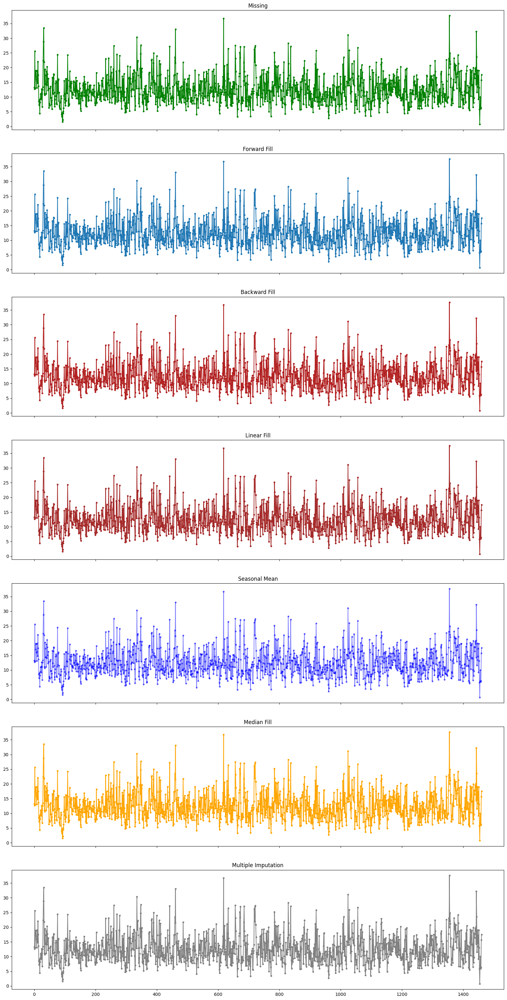

In [15]:
fig, axes = plt.subplots(7, 1, sharex=True, figsize=(20, 40))
plt.rcParams.update({'xtick.bottom' : False})

## 1. Missing -------------------------------
missing['PM10'].plot(title='Missing', ax=axes[0], label='Missing', color='green', style=".-")

## 2. Forward Fill --------------------------
df_ffill = missing.ffill()
df_ffill['PM10'].plot(title='Forward Fill', ax=axes[1], label='Forward Fill', style=".-")

## 3. Backward Fill -------------------------
df_bfill = missing.bfill()
df_bfill['PM10'].plot(title="Backward Fill", ax=axes[2], label='Back Fill', color='firebrick', style=".-")

## 4. Linear Interpolation ------------------
missing['rownum'] = np.arange(missing.shape[0])
df_nona = missing.dropna(subset = ['PM10'])
f = interp1d(df_nona['rownum'], df_nona['PM10'])
missing['linear_fill'] = f(missing['rownum'])
missing['linear_fill'].plot(title="Linear Fill", ax=axes[3], label='Linear Fill', color='brown', style=".-")

## 5. Seasonal Mean ----------------------------
def seasonal_mean(ts, n, lr=0.7):
    """
    Compute the mean of corresponding seasonal periods
    ts: 1D array-like of the time series
    n: Seasonal window length of the time series
    """
    out = np.copy(ts)
    for i, val in enumerate(ts):
        if np.isnan(val):
            ts_seas = ts[i-1::-n]  # previous seasons only
            if np.isnan(np.nanmean(ts_seas)):
                ts_seas = np.concatenate([ts[i-1::-n], ts[i::n]])  # previous and forward
            out[i] = np.nanmean(ts_seas) * lr
    return out

missing['seasonal_mean'] = seasonal_mean(missing.PM10, n=365, lr=1.25)
missing['seasonal_mean'].plot(title="Seasonal Mean", ax=axes[4], label='Seasonal Mean', color='blue', alpha=0.5, style=".-")

## 6. Median ----------------------------
missing['median_fill'] = missing['PM10'].fillna(missing['PM10'].median())
missing['median_fill'].plot(title='Median Fill', ax=axes[5], label='Median Fill', color='orange', style='.-')

## 7. Multiple Imputer
imputer = IterativeImputer(max_iter=10, random_state=0)
missing_values = missing['PM10'].values.reshape(-1, 1)
missing['multiple_impute'] = imputer.fit_transform(missing_values)
missing['multiple_impute'] = missing['multiple_impute'].ravel()
missing['multiple_impute'].plot(title='Multiple Imputation', ax=axes[6], label='Multiple Imputation', color='grey', style='.-')

Seasonal features

In [16]:
missing = air_df01[['Date', 'Daily Average NO2 (ug/m3)']]
# missing = missing[(missing['Date'] >= '2022-01-01') & (missing['Date'] <= '2022-12-31')]
missing.rename(columns={'Daily Average NO2 (ug/m3)': 'NO2'}, inplace=True)
missing

C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_4012\1552770383.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  missing.rename(columns={'Daily Average NO2 (ug/m3)': 'NO2'}, inplace=True)


,Date,NO2
0,2020-01-01,3.658625
1,2020-01-02,2.655652
2,2020-01-03,8.100958
3,2020-01-04,3.720917
4,2020-01-05,4.783000
...,...,...
1456,2023-12-27,1.026500
1457,2023-12-28,5.349417
1458,2023-12-29,2.499875
1459,2023-12-30,0.319875


C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_4012\4281769485.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  missing['rownum'] = np.arange(missing.shape[0])
C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_4012\4281769485.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  missing['linear_fill'] = f(missing['rownum'])
C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_4012\4281769485.py:33: RuntimeWarning: Mean of empty slice
  if np.isnan(np.nanmean(ts_seas)):
C:\Users\Alvin Zhao\AppData\Local\Temp

<Axes: title={'center': 'Multiple Imputation'}>

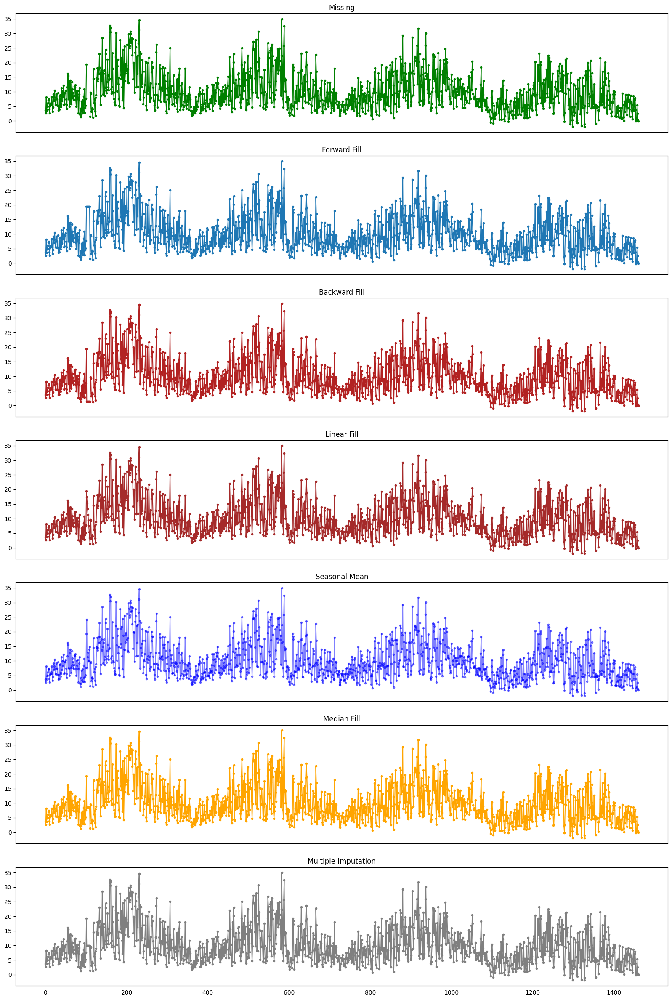

In [17]:
fig, axes = plt.subplots(7, 1, sharex=True, figsize=(20, 30))
plt.rcParams.update({'xtick.bottom' : False})

## 1. Missing -------------------------------
missing['NO2'].plot(title='Missing', ax=axes[0], label='Missing', color='green', style=".-")

## 2. Forward Fill --------------------------
df_ffill = missing.ffill()
df_ffill['NO2'].plot(title='Forward Fill', ax=axes[1], label='Forward Fill', style=".-")

## 3. Backward Fill -------------------------
df_bfill = missing.bfill()
df_bfill['NO2'].plot(title="Backward Fill", ax=axes[2], label='Back Fill', color='firebrick', style=".-")

## 4. Linear Interpolation ------------------
missing['rownum'] = np.arange(missing.shape[0])
df_nona = missing.dropna(subset = ['NO2'])
f = interp1d(df_nona['rownum'], df_nona['NO2'])
missing['linear_fill'] = f(missing['rownum'])
missing['linear_fill'].plot(title="Linear Fill", ax=axes[3], label='Linear Fill', color='brown', style=".-")

## 5. Seasonal Mean ----------------------------
def seasonal_mean(ts, n, lr=0.7):
    """
    Compute the mean of corresponding seasonal periods
    ts: 1D array-like of the time series
    n: Seasonal window length of the time series
    """
    out = np.copy(ts)
    for i, val in enumerate(ts):
        if np.isnan(val):
            ts_seas = ts[i-1::-n]  # previous seasons only
            if np.isnan(np.nanmean(ts_seas)):
                ts_seas = np.concatenate([ts[i-1::-n], ts[i::n]])  # previous and forward
            out[i] = np.nanmean(ts_seas) * lr
    return out

missing['seasonal_mean'] = seasonal_mean(missing.NO2, n=365, lr=1.25)
missing['seasonal_mean'].plot(title="Seasonal Mean", ax=axes[4], label='Seasonal Mean', color='blue', alpha=0.5, style=".-")

## 6. Median ----------------------------
missing['median_fill'] = missing['NO2'].fillna(missing['NO2'].median())
missing['median_fill'].plot(title='Median Fill', ax=axes[5], label='Median Fill', color='orange', style='.-')

## 7. Multiple Imputer
imputer = IterativeImputer(max_iter=10, random_state=0)
missing_values = missing['NO2'].values.reshape(-1, 1)
missing['multiple_impute'] = imputer.fit_transform(missing_values)
missing['multiple_impute'] = missing['multiple_impute'].ravel()
missing['multiple_impute'].plot(title='Multiple Imputation', ax=axes[6], label='Multiple Imputation', color='grey', style='.-')

In [18]:
def seasonal_mean(ts, n, lr=0.7):
    """
    Compute the mean of corresponding seasonal periods
    ts: 1D array-like of the time series
    n: Seasonal window length of the time series
    """
    out = np.copy(ts)
    for i, val in enumerate(ts):
        if np.isnan(val):
            ts_seas = ts[i-1::-n]  # previous seasons only
            if np.isnan(np.nanmean(ts_seas)):
                ts_seas = np.concatenate([ts[i-1::-n], ts[i::n]])  # previous and forward
            out[i] = np.nanmean(ts_seas) * lr
    return out

df_numeric = air_df01.select_dtypes(include=[np.number])
df_filled_numeric = df_numeric.apply(lambda col: seasonal_mean(col, n=365, lr=1))
air_df04 = air_df01.copy()
air_df04[df_numeric.columns] = df_filled_numeric

C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_4012\4264940707.py:11: RuntimeWarning: Mean of empty slice
  if np.isnan(np.nanmean(ts_seas)):
C:\Users\Alvin Zhao\AppData\Local\Temp\ipykernel_4012\4264940707.py:13: RuntimeWarning: Mean of empty slice
  out[i] = np.nanmean(ts_seas) * lr


In [19]:
air_df04.drop(['ET05(C)', 'ET30(C)'], axis=1, inplace=True) # drop 'ET05(C) and 'ET30(C) without any values
missing_values = air_df04.isna().sum()
print(missing_values)

Date                           0
Daily Average NO2 (ug/m3)      0
Daily Average O3 (ug/m3)       0
Daily Average CO (mg/m3)       0
Daily Average PM2.5 (ug/m3)    0
Daily Average PM10 (ug/m3)     0
WDir(Deg)                      0
WSpd(m/s)                      0
GustDir(Deg)                   0
GustSpd(m/s)                   0
WindRun(Km)                    0
Rain(mm)                       0
Tdry(C)                        0
TWet(C)                        0
RH(%)                          0
Tmax(C)                        0
Tmin(C)                        0
Tgmin(C)                       0
ET10(C)                        0
ET20(C)                        0
ET100(C)                       0
Pmsl(hPa)                      0
Pstn(hPa)                      0
Sun(Hrs)                       0
Rad(MJ/m2)                     0
lightCount                     0
heavyCount                     0
Year                           0
Month                          0
Day of Week                    0
Is Weekday

### Conver the categorical variables into numeric

In [20]:
no_num_cols = air_df04.select_dtypes(exclude=['number']).columns
no_num_cols = list(no_num_cols)
no_num_cols.remove('Date')
print(no_num_cols)

['Month', 'Day of Week', 'Is Weekday']


In [21]:
label_encoder = LabelEncoder()

for column in no_num_cols:
    air_df04[column] = label_encoder.fit_transform(air_df04[column])

air_df04

,Date,Daily Average NO2 (ug/m3),Daily Average O3 (ug/m3),Daily Average CO (mg/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),GustSpd(m/s),...,Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,Year,Month,Day of Week,Is Weekday,T(C),trafficCount
0,2020-01-01,3.658625,14.330667,0.092625,6.977292,13.236917,17.0,1.4,349.0,12.9,...,10.9,26.36,5781.687215,150.940860,2020,4,6,1,15.50,5932.628075
1,2020-01-02,2.655652,16.340000,0.072783,4.804792,12.657875,41.0,3.0,353.0,13.9,...,7.7,20.33,6950.922374,253.946237,2020,4,4,1,17.15,7204.868611
2,2020-01-03,8.100958,21.569625,0.167917,15.910583,25.593458,6.0,2.3,1.0,10.3,...,8.5,23.23,6615.646119,202.112903,2020,4,0,1,20.35,6817.759022
3,2020-01-04,3.720917,16.547500,0.059667,5.838958,13.041375,234.0,1.8,274.0,9.8,...,12.3,28.73,5786.146119,156.989247,2020,4,2,0,15.70,5943.135366
4,2020-01-05,4.783000,14.739042,0.061435,3.038708,17.067042,27.0,1.1,291.0,21.1,...,0.1,5.59,7279.936019,305.158824,2020,4,3,0,12.60,7585.094842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,2023-12-27,1.026500,13.433750,0.065217,3.707833,10.000739,158.0,2.3,120.0,9.3,...,9.5,26.91,5320.722222,243.851852,2023,2,6,1,18.00,5564.574074
1457,2023-12-28,5.349417,13.960708,0.111609,3.249250,5.964792,59.0,2.0,269.0,7.7,...,8.4,22.95,5175.287037,276.546296,2023,2,4,1,16.60,5451.833333
1458,2023-12-29,2.499875,15.247458,0.160783,2.030875,6.317250,21.0,4.9,332.0,16.5,...,1.1,12.95,4556.462963,226.981481,2023,2,0,1,19.65,4783.444444
1459,2023-12-30,0.319875,25.080958,0.127696,7.378208,15.679583,339.0,6.6,323.0,16.5,...,6.3,19.25,4510.509259,164.712963,2023,2,2,0,20.35,4675.222222


In [22]:
print(air_df01['Year'].value_counts())
print(air_df04['Year'].value_counts())

Year
2020    366
2021    365
2022    365
2023    365
Name: count, dtype: int64
Year
2020    366
2021    365
2022    365
2023    365
Name: count, dtype: int64


In [23]:
print(air_df01['Month'].value_counts())
print(air_df04['Month'].value_counts())

Month
Jan    124
Mar    124
May    124
Jul    124
Aug    124
Oct    124
Dec    124
Apr    120
Jun    120
Sep    120
Nov    120
Feb    113
Name: count, dtype: int64
Month
4     124
7     124
8     124
5     124
1     124
10    124
2     124
0     120
6     120
11    120
9     120
3     113
Name: count, dtype: int64


In [24]:
print(air_df01['Day of Week'].value_counts())
print(air_df04['Day of Week'].value_counts())

Day of Week
Wed    209
Thu    209
Fri    209
Sat    209
Sun    209
Mon    208
Tue    208
Name: count, dtype: int64
Day of Week
6    209
4    209
0    209
2    209
3    209
1    208
5    208
Name: count, dtype: int64


In [25]:
print(air_df01['Is Weekday'].value_counts())
print(air_df04['Is Weekday'].value_counts())

Is Weekday
True     1043
False     418
Name: count, dtype: int64
Is Weekday
1    1043
0     418
Name: count, dtype: int64


### Outliers

In [26]:
# Define a function to detect outliers using IQR
def detect_outliers(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return (column < lower_bound) | (column > upper_bound)

outliers = air_df04.select_dtypes(exclude='object').apply(detect_outliers)
outliers

,Date,Daily Average NO2 (ug/m3),Daily Average O3 (ug/m3),Daily Average CO (mg/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),GustSpd(m/s),...,Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,Year,Month,Day of Week,Is Weekday,T(C),trafficCount
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,True,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1457,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1458,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1459,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [27]:
# change outliers as median
for column in air_df04.select_dtypes(exclude='object').columns:
    median_value = air_df04[column].median()
    outliers_column = outliers[column]
    air_df04.loc[outliers_column, column] = median_value

air_df04

,Date,Daily Average NO2 (ug/m3),Daily Average O3 (ug/m3),Daily Average CO (mg/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),GustSpd(m/s),...,Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,Year,Month,Day of Week,Is Weekday,T(C),trafficCount
0,2020-01-01,3.658625,14.330667,0.092625,6.977292,13.236917,17.0,1.4,349.0,12.9,...,10.9,26.36,5781.687215,150.940860,2020,4,6,1,15.50,5932.628075
1,2020-01-02,2.655652,16.340000,0.072783,4.804792,12.657875,41.0,3.0,353.0,13.9,...,7.7,20.33,6950.922374,253.946237,2020,4,4,1,17.15,7204.868611
2,2020-01-03,8.100958,21.569625,0.167917,5.028417,11.787917,6.0,2.3,1.0,10.3,...,8.5,23.23,6615.646119,202.112903,2020,4,0,1,20.35,6817.759022
3,2020-01-04,3.720917,16.547500,0.059667,5.838958,13.041375,234.0,1.8,274.0,9.8,...,12.3,28.73,5786.146119,156.989247,2020,4,2,0,15.70,5943.135366
4,2020-01-05,4.783000,14.739042,0.061435,3.038708,17.067042,27.0,1.1,291.0,21.1,...,0.1,5.59,7279.936019,305.158824,2020,4,3,0,12.60,7585.094842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,2023-12-27,1.026500,13.433750,0.065217,3.707833,10.000739,158.0,2.3,120.0,9.3,...,9.5,26.91,5320.722222,243.851852,2023,2,6,1,18.00,5564.574074
1457,2023-12-28,5.349417,13.960708,0.111609,3.249250,5.964792,59.0,2.0,269.0,7.7,...,8.4,22.95,5175.287037,276.546296,2023,2,4,1,16.60,5451.833333
1458,2023-12-29,2.499875,15.247458,0.160783,2.030875,6.317250,21.0,4.9,332.0,16.5,...,1.1,12.95,4556.462963,226.981481,2023,2,0,1,19.65,4783.444444
1459,2023-12-30,0.319875,25.080958,0.127696,7.378208,15.679583,339.0,6.6,323.0,16.5,...,6.3,19.25,4510.509259,164.712963,2023,2,2,0,20.35,4675.222222


In [28]:
print(air_df04.columns)

Index(['Date', 'Daily Average NO2 (ug/m3)', 'Daily Average O3 (ug/m3)',
       'Daily Average CO (mg/m3)', 'Daily Average PM2.5 (ug/m3)',
       'Daily Average PM10 (ug/m3)', 'WDir(Deg)', 'WSpd(m/s)', 'GustDir(Deg)',
       'GustSpd(m/s)', 'WindRun(Km)', 'Rain(mm)', 'Tdry(C)', 'TWet(C)',
       'RH(%)', 'Tmax(C)', 'Tmin(C)', 'Tgmin(C)', 'ET10(C)', 'ET20(C)',
       'ET100(C)', 'Pmsl(hPa)', 'Pstn(hPa)', 'Sun(Hrs)', 'Rad(MJ/m2)',
       'lightCount', 'heavyCount', 'Year', 'Month', 'Day of Week',
       'Is Weekday', 'T(C)', 'trafficCount'],
      dtype='object')


### Data scaling

In [29]:
columns_to_scale = ['Daily Average NO2 (ug/m3)', 'Daily Average O3 (ug/m3)', 
                    'Daily Average CO (mg/m3)', 'Daily Average PM2.5 (ug/m3)', 'Daily Average PM10 (ug/m3)',
                    'WDir(Deg)', 'WSpd(m/s)', 'GustDir(Deg)', 'GustSpd(m/s)', 'WindRun(Km)', 
                    'Rain(mm)', 'Tdry(C)', 'TWet(C)', 'RH(%)', 'Tmax(C)', 'Tmin(C)', 
                    'Tgmin(C)', 'ET10(C)', 'ET20(C)', 'ET100(C)', 'Pmsl(hPa)', 'Pstn(hPa)',
                    'Sun(Hrs)', 'Rad(MJ/m2)', 'lightCount', 'heavyCount', 'Year', 'Month',
                    'Day of Week', 'Is Weekday', 'T(C)', 'trafficCount']

# use Min-Max Scaler
scaler = MinMaxScaler()
air_df05 = air_df04.copy()
air_df05[columns_to_scale] = scaler.fit_transform(air_df05[columns_to_scale])
air_df05

,Date,Daily Average NO2 (ug/m3),Daily Average O3 (ug/m3),Daily Average CO (mg/m3),Daily Average PM2.5 (ug/m3),Daily Average PM10 (ug/m3),WDir(Deg),WSpd(m/s),GustDir(Deg),GustSpd(m/s),...,Sun(Hrs),Rad(MJ/m2),lightCount,heavyCount,Year,Month,Day of Week,Is Weekday,T(C),trafficCount
0,2020-01-01,0.205419,0.414651,0.262071,0.665017,0.547287,0.047222,0.172840,0.969359,0.500000,...,0.778571,0.776173,0.257891,0.257657,0.0,0.363636,1.000000,1.0,0.582751,0.260495
1,2020-01-02,0.168966,0.475473,0.205929,0.435678,0.521954,0.113889,0.370370,0.980501,0.546296,...,0.550000,0.594765,0.477450,0.467036,0.0,0.363636,0.666667,1.0,0.659674,0.479844
2,2020-01-03,0.366873,0.633773,0.475099,0.459285,0.483893,0.016667,0.283951,0.000000,0.379630,...,0.607143,0.682010,0.414492,0.361675,0.0,0.363636,0.000000,1.0,0.808858,0.413102
3,2020-01-04,0.207683,0.481754,0.168819,0.544850,0.538732,0.650000,0.222222,0.760446,0.356481,...,0.878571,0.847473,0.258729,0.269952,0.0,0.363636,0.333333,0.0,0.592075,0.262306
4,2020-01-05,0.246284,0.427012,0.173822,0.249242,0.714856,0.075000,0.135802,0.807799,0.879630,...,0.007143,0.151324,0.539232,0.571136,0.0,0.363636,0.500000,0.0,0.447552,0.545399
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,2023-12-27,0.109756,0.387501,0.184525,0.319878,0.405703,0.438889,0.283951,0.331476,0.333333,...,0.678571,0.792720,0.171332,0.446517,1.0,0.181818,1.000000,1.0,0.699301,0.197038
1457,2023-12-28,0.266870,0.403452,0.315783,0.271468,0.229129,0.163889,0.246914,0.746518,0.259259,...,0.600000,0.673586,0.144022,0.512975,1.0,0.181818,0.666667,1.0,0.634033,0.177600
1458,2023-12-29,0.163305,0.442402,0.454915,0.142851,0.244549,0.058333,0.604938,0.922006,0.666667,...,0.078571,0.372744,0.027819,0.412225,1.0,0.181818,0.000000,1.0,0.776224,0.062362
1459,2023-12-30,0.084074,0.740060,0.361299,0.707340,0.654154,0.941667,0.814815,0.896936,0.666667,...,0.450000,0.562274,0.019190,0.285652,1.0,0.181818,0.333333,0.0,0.808858,0.043703


## Exploratory data analysis

### PM2.5

In [30]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average PM2.5 for All Years'] + [f'Daily Average PM2.5 for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['Daily Average PM2.5 (ug/m3)'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['Daily Average PM2.5 (ug/m3)'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average PM2.5 in Wellington by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="PM2.5 (ug/m3)")

fig.show()

In [31]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['Daily Average PM2.5 (ug/m3)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['Daily Average PM2.5 (ug/m3)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average PM2.5 in Wellington',
    xaxis_title='Month',
    yaxis_title='PM2.5 (ug/m3)',
    height=500,
    width=1000
)

fig.show()

# Weekly average value time-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['Daily Average PM2.5 (ug/m3)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['Daily Average PM2.5 (ug/m3)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average PM2.5 in Wellington',
    xaxis_title='Day of Week',
    yaxis_title='PM2.5 (ug/m3)',
    height=500,
    width=1000
)

fig2.show()

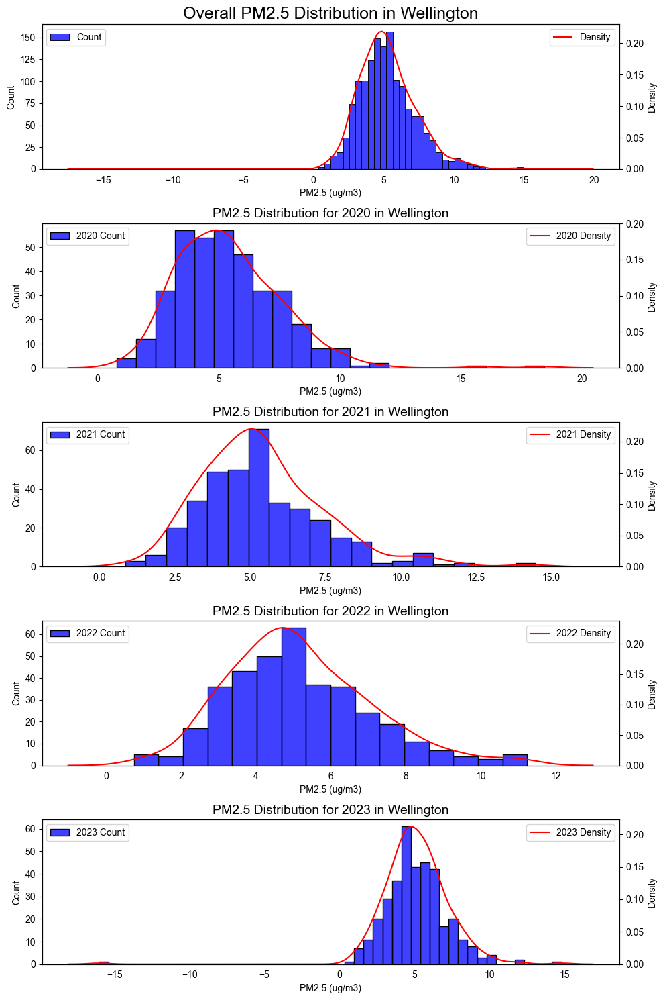

In [32]:
# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['Daily Average PM2.5 (ug/m3)'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['Daily Average PM2.5 (ug/m3)'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['Daily Average PM2.5 (ug/m3)'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="PM2.5 Distribution in Wellington",
                  yaxis1=dict(title='PM2.5 (ug/m3)'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['Daily Average PM2.5 (ug/m3)'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['Daily Average PM2.5 (ug/m3)'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall PM2.5 Distribution in Wellington', fontsize=18)
axs[0].set_xlabel('PM2.5 (ug/m3)')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')

for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['Daily Average PM2.5 (ug/m3)'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['Daily Average PM2.5 (ug/m3)'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'PM2.5 Distribution for {year} in Wellington', fontsize=14)
    ax.set_xlabel('PM2.5 (ug/m3)')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

### PM10

In [33]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average PM10 for All Years'] + [f'Daily Average PM10 for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['Daily Average PM10 (ug/m3)'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['Daily Average PM10 (ug/m3)'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average PM10 in Wellington by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="PM10 (ug/m3)")

fig.show()

In [34]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['Daily Average PM10 (ug/m3)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['Daily Average PM10 (ug/m3)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average PM10 in Wellington',
    xaxis_title='Month',
    yaxis_title='PM10 (ug/m3)',
    height=500,
    width=1000
)

fig.show()

#Weekly average value time-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['Daily Average PM10 (ug/m3)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig2.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['Daily Average PM10 (ug/m3)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average PM10 in Wellington',
    xaxis_title='Day of Week',
    yaxis_title='PM10 (ug/m3)',
    height=500,
    width=1000
)

fig2.show()

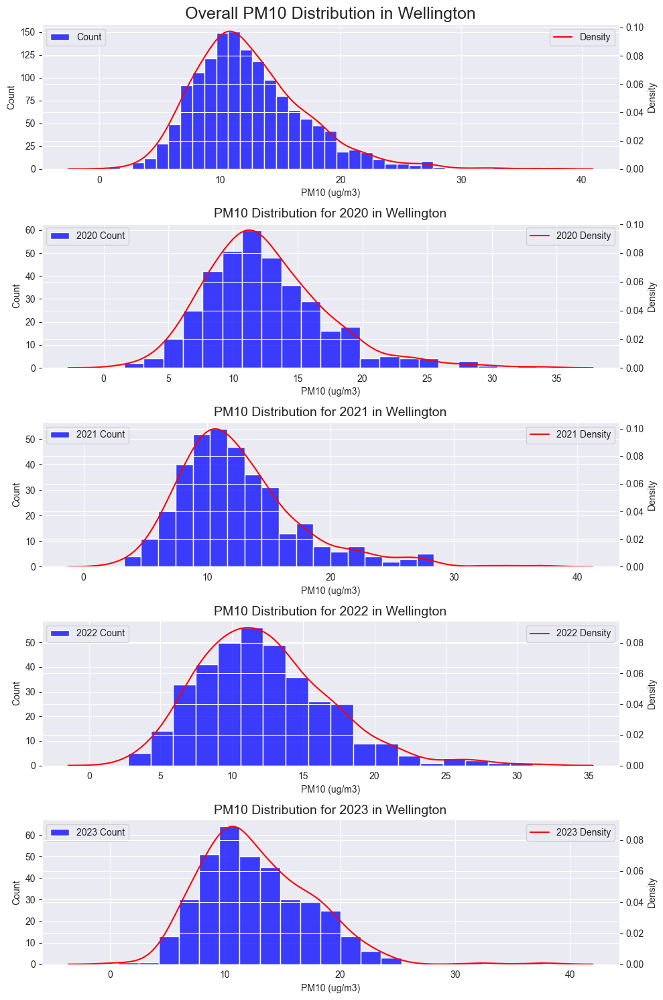

In [35]:
# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['Daily Average PM10 (ug/m3)'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['Daily Average PM10 (ug/m3)'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['Daily Average PM10 (ug/m3)'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="PM10 Distribution in Wellington",
                  yaxis1=dict(title='PM10 (ug/m3)'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['Daily Average PM10 (ug/m3)'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['Daily Average PM10 (ug/m3)'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall PM10 Distribution in Wellington', fontsize=18)
axs[0].set_xlabel('PM10 (ug/m3)')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')

for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['Daily Average PM10 (ug/m3)'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['Daily Average PM10 (ug/m3)'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'PM10 Distribution for {year} in Wellington', fontsize=14)
    ax.set_xlabel('PM10 (ug/m3)')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

### NO2

In [36]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average NO2 for All Years'] + [f'Daily Average NO2 for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['Daily Average NO2 (ug/m3)'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['Daily Average NO2 (ug/m3)'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average NO2 in Wellington by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="NO2 (ug/m3)")

fig.show()

In [37]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['Daily Average NO2 (ug/m3)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['Daily Average NO2 (ug/m3)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average NO2 in Wellington',
    xaxis_title='Month',
    yaxis_title='NO2 (ug/m3)',
    height=500,
    width=1000
)

fig.show()

# Weekly average value time-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['Daily Average NO2 (ug/m3)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig2.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['Daily Average NO2 (ug/m3)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average NO2 in Wellington',
    xaxis_title='Day of Week',
    yaxis_title='NO2 (ug/m3)',
    height=500,
    width=1000
)

fig2.show()

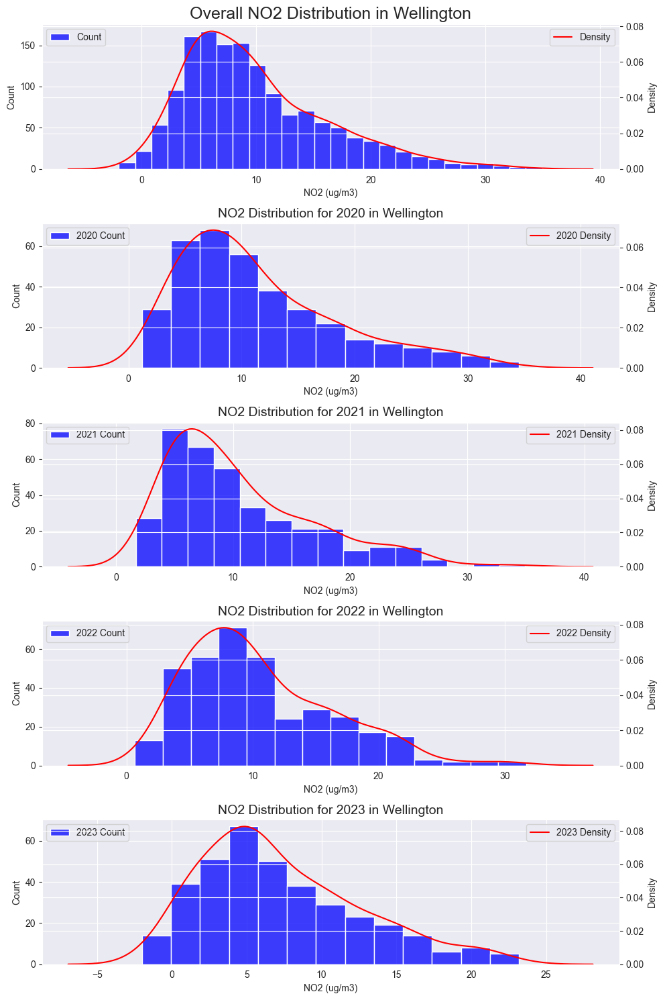

In [38]:
# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['Daily Average NO2 (ug/m3)'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['Daily Average NO2 (ug/m3)'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['Daily Average NO2 (ug/m3)'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="NO2 Distribution in Wellington",
                  yaxis1=dict(title='NO2 (ug/m3)'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['Daily Average NO2 (ug/m3)'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['Daily Average NO2 (ug/m3)'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall NO2 Distribution in Wellington', fontsize=18)
axs[0].set_xlabel('NO2 (ug/m3)')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')


for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['Daily Average NO2 (ug/m3)'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['Daily Average NO2 (ug/m3)'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'NO2 Distribution for {year} in Wellington', fontsize=14)
    ax.set_xlabel('NO2 (ug/m3)')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

### CO

In [39]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average CO for All Years'] + [f'Daily Average CO for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['Daily Average CO (mg/m3)'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['Daily Average CO (mg/m3)'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average CO in Wellington by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="CO (mg/m3)")

fig.show()

In [40]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['Daily Average CO (mg/m3)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['Daily Average CO (mg/m3)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average CO in Wellington',
    xaxis_title='Month',
    yaxis_title='CO (mg/m3)',
    height=500,
    width=1000
)

fig.show()

# Weekly average value timw-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['Daily Average CO (mg/m3)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig2.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['Daily Average CO (mg/m3)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average CO in Wellington',
    xaxis_title='Day of Week',
    yaxis_title='CO (mg/m3)',
    height=500,
    width=1000
)

fig2.show()

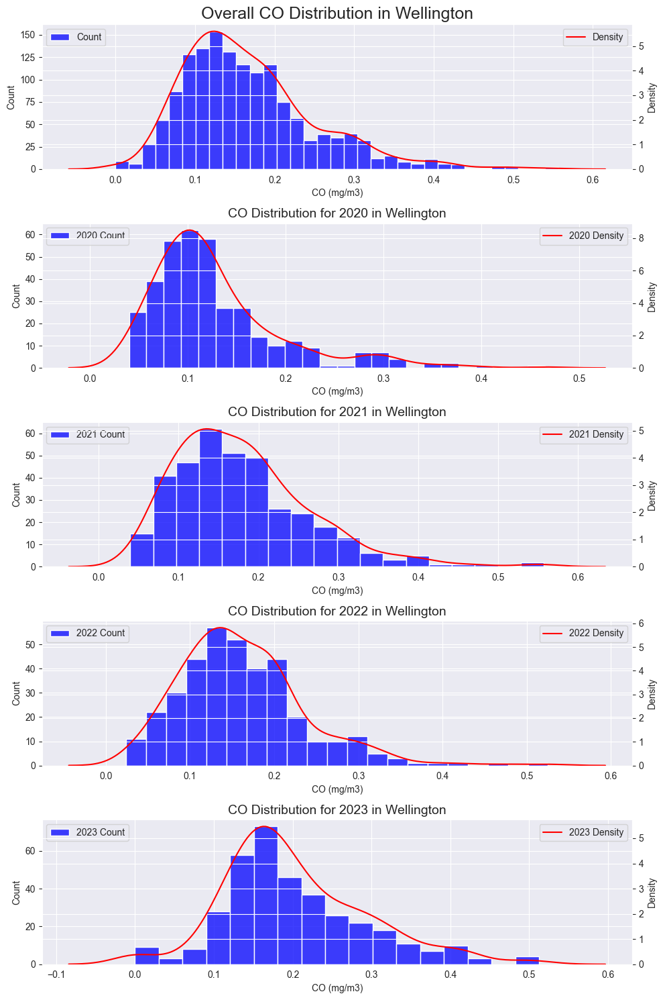

In [41]:
# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['Daily Average CO (mg/m3)'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['Daily Average CO (mg/m3)'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['Daily Average CO (mg/m3)'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="CO Distribution in Wellington",
                  yaxis1=dict(title='CO (mg/m3)'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['Daily Average CO (mg/m3)'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['Daily Average CO (mg/m3)'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall CO Distribution in Wellington', fontsize=18)
axs[0].set_xlabel('CO (mg/m3)')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')

for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['Daily Average CO (mg/m3)'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['Daily Average CO (mg/m3)'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'CO Distribution for {year} in Wellington', fontsize=14)
    ax.set_xlabel('CO (mg/m3)')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

### Wind speed

In [42]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average Wind Speed for All Years'] + [f'Daily Average Wind Speed for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['WSpd(m/s)'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['WSpd(m/s)'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average Wind Speed in Wellington by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="Wind Speed (m/s)")

fig.show()

In [43]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['WSpd(m/s)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['WSpd(m/s)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average Wind Speed in Wellington',
    xaxis_title='Month',
    yaxis_title='Wind Speed (m/s)',
    height=500,
    width=1000
)

fig.show()

#Weekly average value time-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['WSpd(m/s)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig2.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['WSpd(m/s)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average Wind Speed in Wellington',
    xaxis_title='Day of Week',
    yaxis_title='Wind Speed (m/s)',
    height=500,
    width=1000
)

fig2.show()

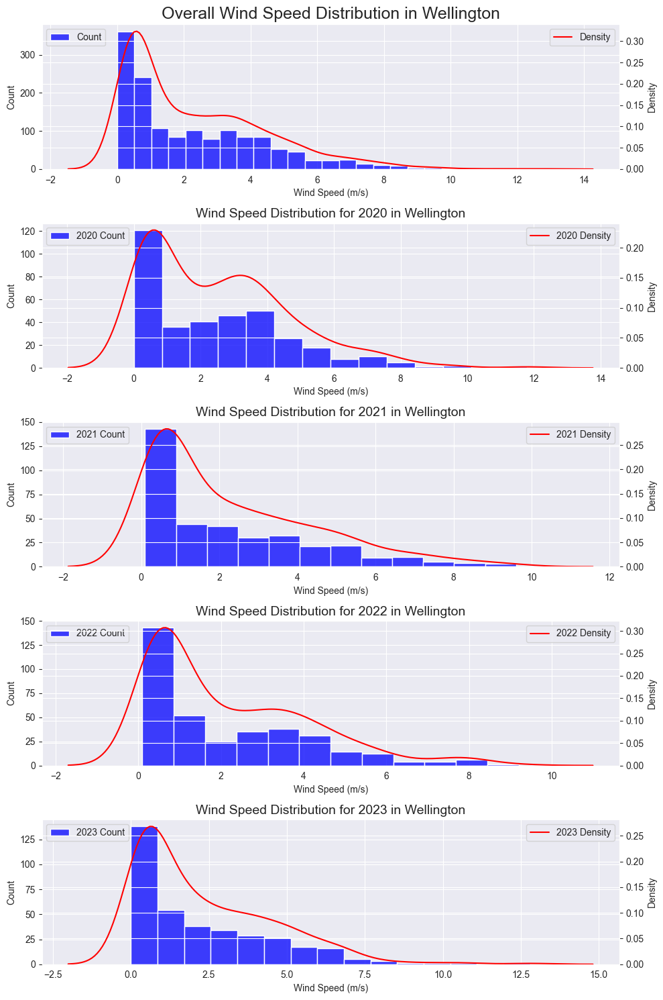

In [44]:
# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['WSpd(m/s)'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['WSpd(m/s)'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['WSpd(m/s)'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="Wind Speed Distribution in Wellington",
                  yaxis1=dict(title='Wind Speed (m/s)'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['WSpd(m/s)'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['WSpd(m/s)'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall Wind Speed Distribution in Wellington', fontsize=18)
axs[0].set_xlabel('Wind Speed (m/s)')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')

for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['WSpd(m/s)'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['WSpd(m/s)'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'Wind Speed Distribution for {year} in Wellington', fontsize=14)
    ax.set_xlabel('Wind Speed (m/s)')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

### Temperature

In [45]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average Temperature for All Years'] + [f'Daily Average Temperature for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['T(C)'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['T(C)'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average Temperature in Wellington by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="Temperature (\u00B0C)")

fig.show()

In [46]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['T(C)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['T(C)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average Temperature in Wellington',
    xaxis_title='Month',
    yaxis_title='Temperature (\u00B0C)',
    height=500,
    width=1000
)

fig.show()

#Weekly average value time-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['T(C)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig2.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['T(C)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average Temperature in Wellington',
    xaxis_title='Day of Week',
    yaxis_title='Temperature (\u00B0C)',
    height=500,
    width=1000
)

fig2.show()

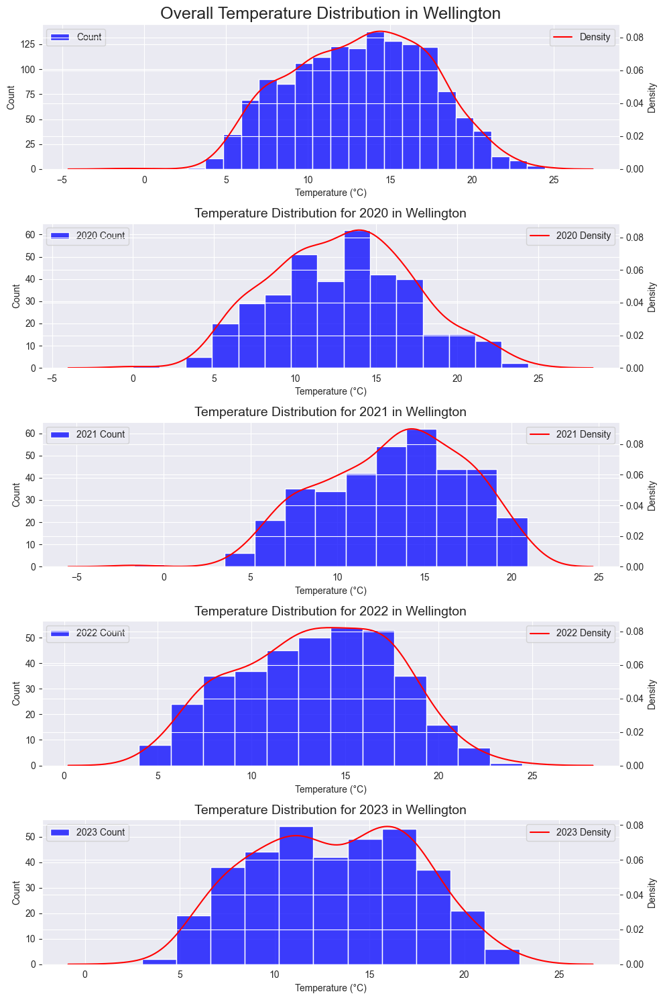

In [47]:
# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['T(C)'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['T(C)'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['T(C)'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="Temperature Distribution in Wellington",
                  yaxis1=dict(title='Temperature (\u00B0C)'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['T(C)'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['T(C)'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall Temperature Distribution in Wellington', fontsize=18)
axs[0].set_xlabel('Temperature (\u00B0C)')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')

for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['T(C)'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['T(C)'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'Temperature Distribution for {year} in Wellington', fontsize=14)
    ax.set_xlabel('Temperature (\u00B0C)')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

### Relative humidity

In [48]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average Relative Humidity for All Years'] + [f'Daily Average Relative Humidity for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['RH(%)'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['RH(%)'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average Relative Humidity in Wellington by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="Humidity (%)")

fig.show()

In [49]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['RH(%)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['RH(%)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average Relative Humidity in Wellington',
    xaxis_title='Month',
    yaxis_title='Humidity (%)',
    height=500,
    width=1000
)

fig.show()

#Weekly average value time-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['RH(%)'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig2.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['RH(%)'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average Relative Humidity in Wellington',
    xaxis_title='Day of Week',
    yaxis_title='Humidity (%)',
    height=500,
    width=1000
)

fig2.show()

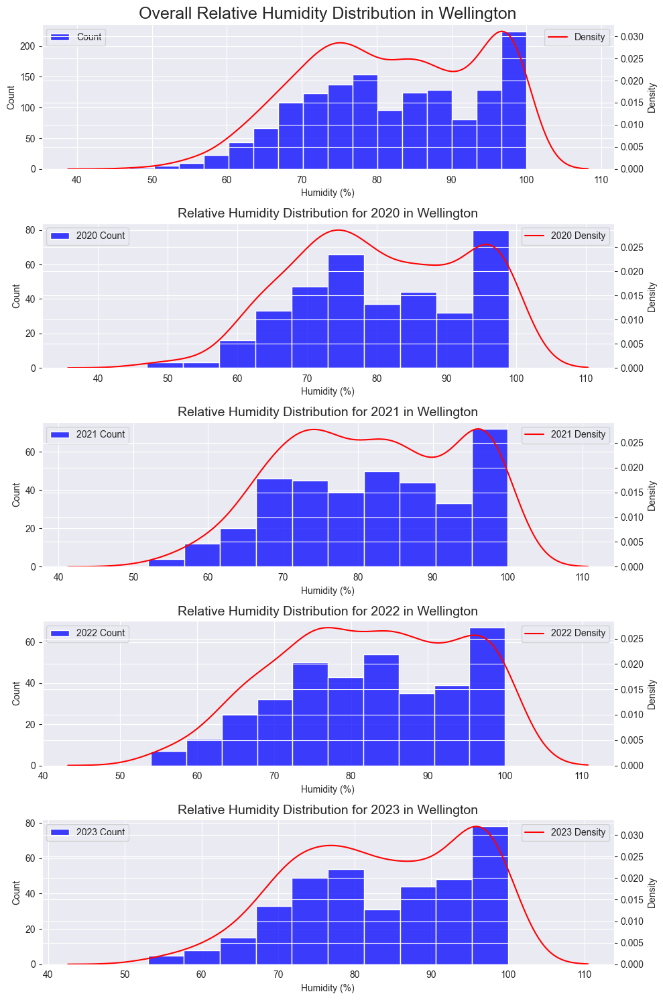

In [50]:
# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['RH(%)'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['RH(%)'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['RH(%)'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="Relative Humidity Distribution in Wellington",
                  yaxis1=dict(title='Humidity (%)'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['RH(%)'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['RH(%)'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall Relative Humidity Distribution in Wellington', fontsize=18)
axs[0].set_xlabel('Humidity (%)')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')

for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['RH(%)'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['RH(%)'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'Relative Humidity Distribution for {year} in Wellington', fontsize=14)
    ax.set_xlabel('Humidity (%)')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

### Traffic count

In [51]:
# Daily average value time-trend
fig = make_subplots(rows=5, cols=1, subplot_titles=['Daily Average Traffic for All Years'] + [f'Daily Average Traffic for {year}' for year in years])

fig.add_trace(
    go.Scatter(x=air_df01['Date'], y=air_df01['trafficCount'], mode='lines', name='All Years'),
    row=1, col=1
)

for i, year in enumerate(years):
    yearly_data = air_df01[air_df01['Year'] == year]

    fig.add_trace(
        go.Scatter(x=yearly_data['Date'], y=yearly_data['trafficCount'], mode='lines', name=f'{year}'),
        row=i+2, col=1  
    )

fig.update_layout(height=1500, width=1000, title_text="Daily Average Traffic in Wellington by Year")
fig.update_xaxes(title_text="Year - Month")
fig.update_yaxes(title_text="Traffic Flow")

fig.show()

In [52]:
# Monthly average value time-trend
colors = ['#636EFA', '#EF553B', '#00CC96', '#AB63FA', '#FFA15A', '#19D3F3', '#FF6692', '#B6E880', '#FF97FF', '#FECB52']

fig = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df02[air_df02['Year'] == year_to_plot]

    fig.add_trace(go.Scatter(
        x=data['Month'], 
        y=data['trafficCount'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig.add_trace(go.Scatter(
            x=[data['Month'].iloc[-1]], 
            y=[data['trafficCount'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig.update_layout(
    title='Monthly Average Traffic in Wellington',
    xaxis_title='Month',
    yaxis_title='Traffic Flow',
    height=500,
    width=1000
)

fig.show()

# Weekly average value time-trend
fig2 = go.Figure()

for i, year_to_plot in enumerate(years):
    data = air_df03[air_df03['Year'] == year_to_plot]

    fig2.add_trace(go.Scatter(
        x=data['Day of Week'], 
        y=data['trafficCount'], 
        mode='lines+markers',
        name=str(year_to_plot),
        marker=dict(color=colors[i % len(colors)])
    ))

    if not data.empty:
        fig2.add_trace(go.Scatter(
            x=[data['Day of Week'].iloc[-1]], 
            y=[data['trafficCount'].iloc[-1]], 
            text=[str(year_to_plot)],
            mode='text',
            showlegend=False
        ))

fig2.update_layout(
    title='Day of Week Average Traffic in Wellington',
    xaxis_title='Day of Week',
    yaxis_title='Traffic Flow',
    height=500,
    width=1000
)

fig2.show()

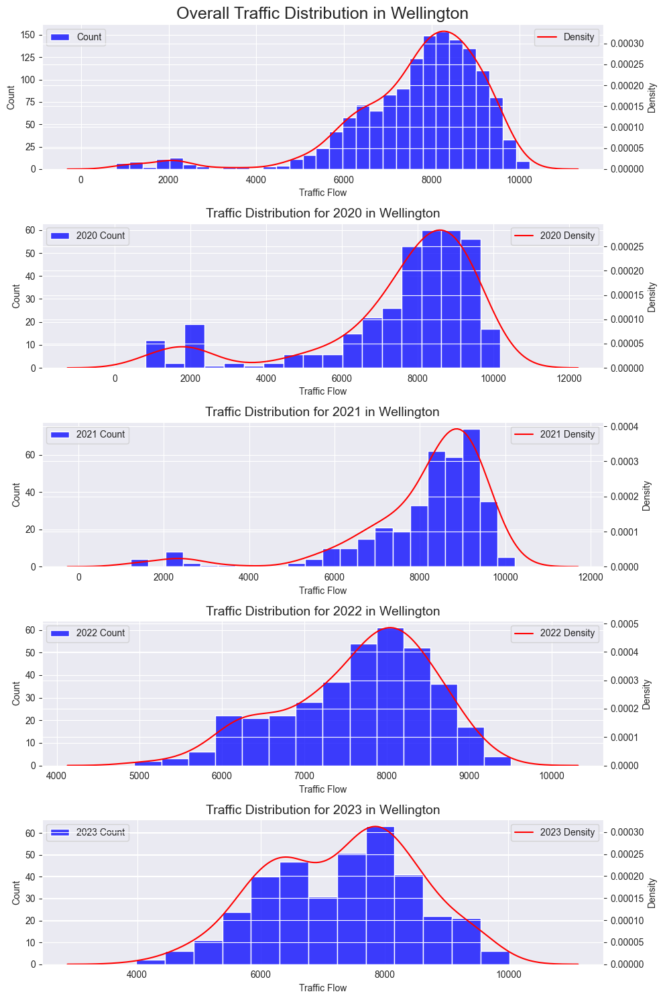

In [53]:
# Box-plot distribution
fig = make_subplots(rows=1, cols=3, subplot_titles=('Year-Wise Distribution', 
                                                    'Month-Wise Distribution', 
                                                    'Overall Distribution'))

fig.add_trace(
    go.Box(x=air_df01['Year'], y=air_df01['trafficCount'], name='Year-Wise'),
    row=1, col=1
)

fig.add_trace(
    go.Box(x=air_df01['Month'], y=air_df01['trafficCount'], name='Month-Wise'),
    row=1, col=2
)

fig.add_trace(
    go.Box(y=air_df01['trafficCount'], name='Overall'),
    row=1, col=3
)

fig.update_layout(height=500, width=1000, 
                  title_text="Traffic Distribution in Wellington",
                  yaxis1=dict(title='Traffic Flow'))

fig.show()

# Histogram distribution
fig, axs = plt.subplots(5, 1, figsize=(10, 15))

sns.histplot(x=air_df01['trafficCount'], ax=axs[0], label="Count", color='blue')
ax2 = axs[0].twinx()
sns.kdeplot(x=air_df01['trafficCount'], ax=ax2, color="red", label="Density")
axs[0].set_title('Overall Traffic Distribution in Wellington', fontsize=18)
axs[0].set_xlabel('Traffic Flow')
axs[0].legend(loc='upper left')
ax2.legend(loc='upper right')

for i, year in enumerate(years):
    ax = axs[i + 1]  
    ax2 = ax.twinx()

    yearly_data = air_df01[air_df01['Year'] == year]

    sns.histplot(x=yearly_data['trafficCount'], ax=ax, label=f"{year} Count", color='blue')
    sns.kdeplot(x=yearly_data['trafficCount'], ax=ax2, color="red", label=f"{year} Density")

    ax.set_title(f'Traffic Distribution for {year} in Wellington', fontsize=14)
    ax.set_xlabel('Traffic Flow')
    ax.legend(loc='upper left')
    ax2.legend(loc='upper right')

sns.set_style('darkgrid')
plt.tight_layout()
plt.show()

## Correlation Analysis

Text(0.5, 1.0, 'Correlation Matrix for Wellington')

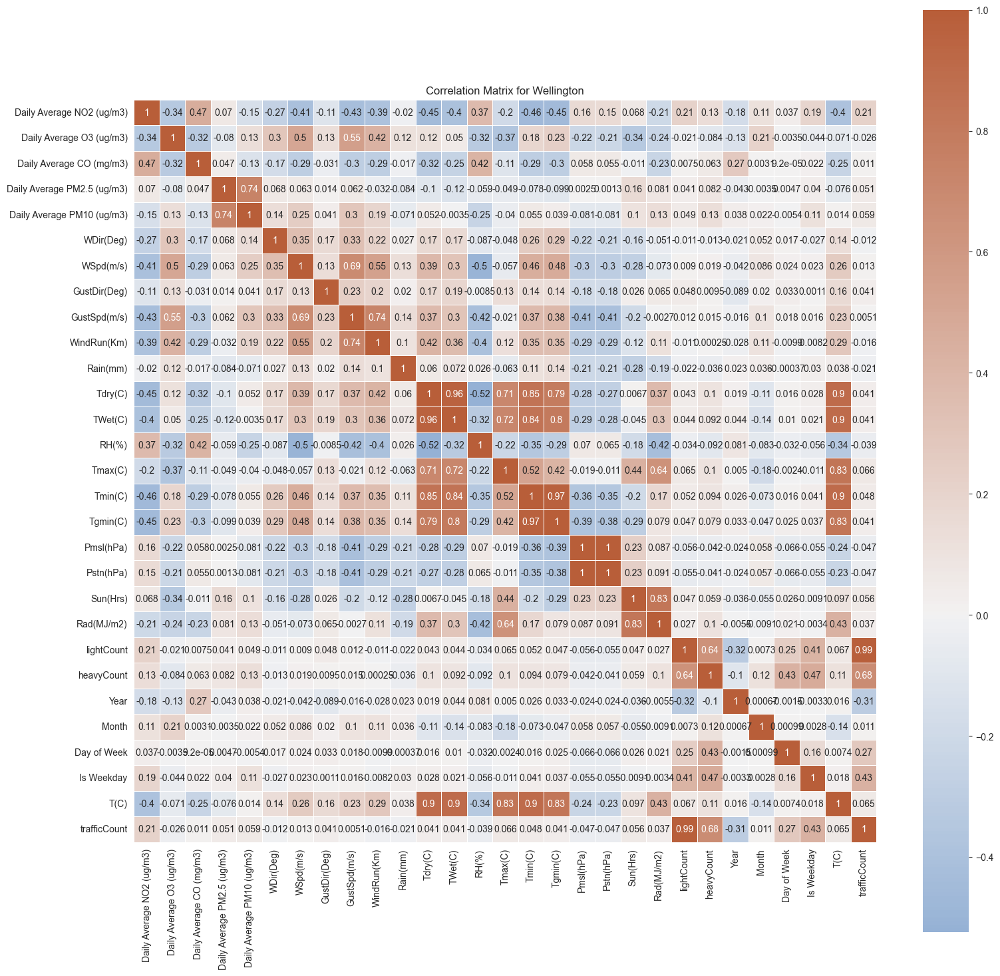

In [54]:
air_df06 = air_df04.copy()
air_df06 = air_df04.drop(['Date', 'ET10(C)','ET20(C)', 'ET100(C)'], axis=1)

corr =air_df06.corr()

# sns.heatmap(corr, annot=True, fmt=".2f")
# sns.set(rc={'figure.figsize':(30,30)})

f, ax = plt.subplots(figsize=(18, 18))
cmap = sns.diverging_palette(250, 25, as_cmap=True)
sns.heatmap(corr, cmap=cmap, vmax=None, center=0, square=True, annot=True, linewidths=.5)

plt.title('Correlation Matrix for Wellington')

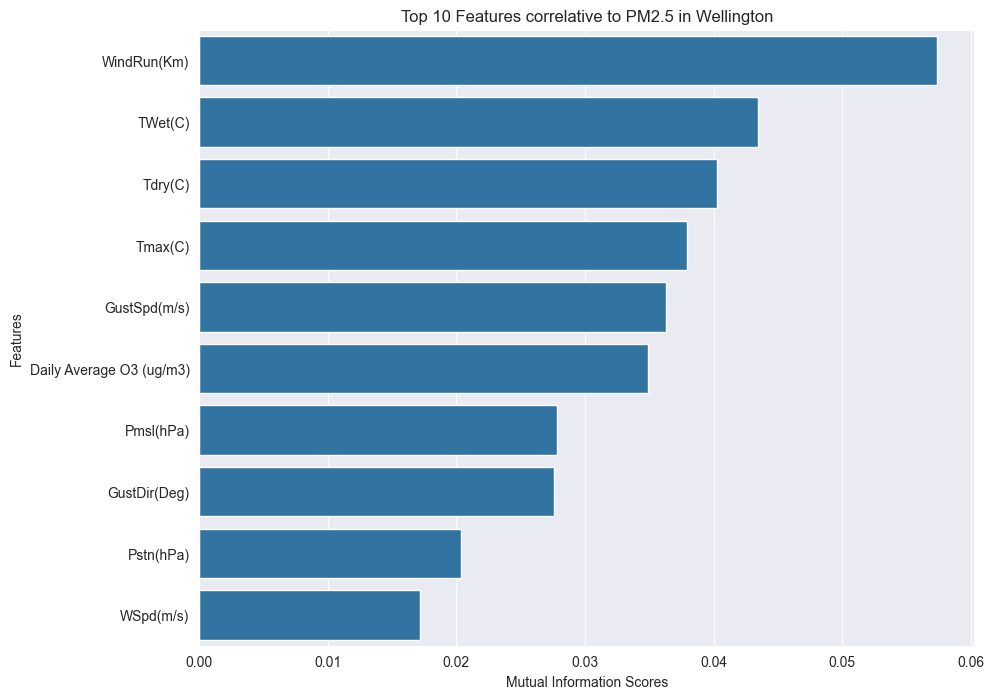

In [55]:
# Assuming PM2.5 as target feature
X = air_df06.drop(['Daily Average PM2.5 (ug/m3)', 'Daily Average PM10 (ug/m3)', 'T(C)', 'trafficCount'], axis=1)
y = air_df06['Daily Average PM2.5 (ug/m3)']

# Select 10 best variables using ANOVA
selector = SelectKBest(mutual_info_regression, k=10)
selector.fit(X, y)

support = selector.get_support()
features = X.loc[:,support].columns.tolist()
scores = selector.scores_[support]

features_scores = pd.DataFrame({'Feature': features, 'Score': scores})
features_scores = features_scores.sort_values(by='Score', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(x='Score', y='Feature', data=features_scores)
plt.title('Top 10 Features correlative to PM2.5 in Wellington')
plt.xlabel('Mutual Information Scores')
plt.ylabel('Features')
plt.show()

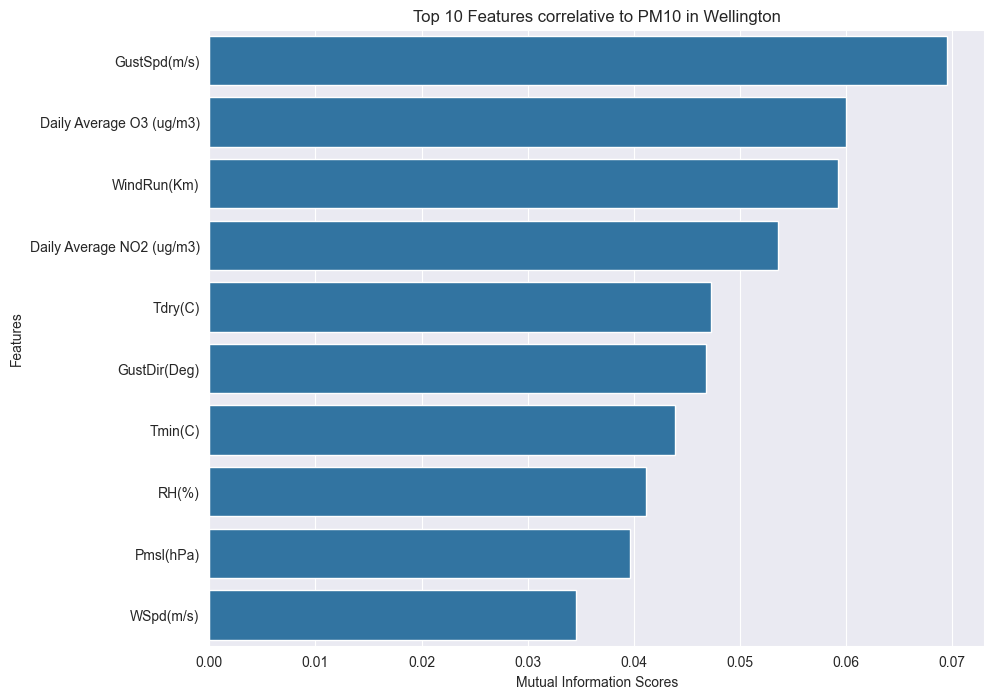

In [56]:
# Assuming PM10 as target feature
X = air_df06.drop(['Daily Average PM2.5 (ug/m3)', 'Daily Average PM10 (ug/m3)', 'T(C)', 'trafficCount'], axis=1)
y = air_df06['Daily Average PM10 (ug/m3)']

# Select 10 best variables using ANOVA
selector = SelectKBest(mutual_info_regression, k=10)
selector.fit(X, y)

support = selector.get_support()
features = X.loc[:,support].columns.tolist()
scores = selector.scores_[support]

features_scores = pd.DataFrame({'Feature': features, 'Score': scores})
features_scores = features_scores.sort_values(by='Score', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(x='Score', y='Feature', data=features_scores)
plt.title('Top 10 Features correlative to PM10 in Wellington')
plt.xlabel('Mutual Information Scores')
plt.ylabel('Features')
plt.show()

### NO2

In [57]:
fig = make_subplots(rows=1, cols=2, subplot_titles=['NO2 and PM2.5', 'NOx and PM10'])

unique_years = air_df01['Year'].unique()
color_map = {year: color for year, color in zip(unique_years, colors)}

def add_scatter_traces(fig, x, y, row, col, show_legend):
    for year in unique_years:
        filtered_data = air_df01[air_df01['Year'] == year]
        fig.add_trace(
            go.Scatter(x=filtered_data[x], y=filtered_data[y], mode='markers', name=str(year),
                       marker=dict(color=color_map[year]), showlegend=show_legend),
            row=row, col=col
        )

add_scatter_traces(fig, 'Daily Average NO2 (ug/m3)', 'Daily Average PM2.5 (ug/m3)', 1, 1, False)
add_scatter_traces(fig, 'Daily Average NO2 (ug/m3)', 'Daily Average PM10 (ug/m3)', 1, 2, False)

fig.update_layout(height=600, width=800, title_text="NO2 and Air Quality Relationships in Wellington")
fig.update_xaxes(title_text="NO2 (ug/m3)")
fig.update_yaxes(title_text="PM2.5 (ug/m3)", row=1, col=1)
fig.update_yaxes(title_text="PM10 (ug/m3)", row=1, col=2)

fig.show()

### CO

In [58]:
fig = make_subplots(rows=1, cols=2, subplot_titles=['CO and PM2.5', 'CO and PM10'])

unique_years = air_df01['Year'].unique()
color_map = {year: color for year, color in zip(unique_years, colors)}

def add_scatter_traces(fig, x, y, row, col, show_legend):
    for year in unique_years:
        filtered_data = air_df01[air_df01['Year'] == year]
        fig.add_trace(
            go.Scatter(x=filtered_data[x], y=filtered_data[y], mode='markers', name=str(year),
                       marker=dict(color=color_map[year]), showlegend=show_legend),
            row=row, col=col
        )

add_scatter_traces(fig, 'Daily Average CO (mg/m3)', 'Daily Average PM2.5 (ug/m3)', 1, 1, False)
add_scatter_traces(fig, 'Daily Average CO (mg/m3)', 'Daily Average PM10 (ug/m3)', 1, 2, False)

fig.update_layout(height=600, width=800, title_text="CO and Air Quality Relationships in Wellington")
fig.update_xaxes(title_text="CO (mg/m3)")
fig.update_yaxes(title_text="PM2.5 (ug/m3)", row=1, col=1)
fig.update_yaxes(title_text="PM10 (ug/m3)", row=1, col=2)

fig.show()

### Wind speed

In [59]:
fig = make_subplots(rows=1, cols=2, subplot_titles=['Wind Speed and PM2.5', 'Wind Speed and PM10'])

unique_years = air_df01['Year'].unique()
color_map = {year: color for year, color in zip(unique_years, colors)}

def add_scatter_traces(fig, x, y, row, col, show_legend):
    for year in unique_years:
        filtered_data = air_df01[air_df01['Year'] == year]
        fig.add_trace(
            go.Scatter(x=filtered_data[x], y=filtered_data[y], mode='markers', name=str(year),
                       marker=dict(color=color_map[year]), showlegend=show_legend),
            row=row, col=col
        )

add_scatter_traces(fig, 'WSpd(m/s)', 'Daily Average PM2.5 (ug/m3)', 1, 1, False)
add_scatter_traces(fig, 'WSpd(m/s)', 'Daily Average PM10 (ug/m3)', 1, 2, False)

fig.update_layout(height=600, width=800, title_text="Wind Speed and Air Quality Relationships in Wellington")
fig.update_xaxes(title_text="Wind Speed (m/s)")
fig.update_yaxes(title_text="PM2.5 (ug/m3)", row=1, col=1)
fig.update_yaxes(title_text="PM10 (ug/m3)", row=1, col=2)

fig.show()

In [60]:
fig = make_subplots(rows=1, cols=2, subplot_titles=['Wind Run and PM2.5', 'Wind Run and PM10'])

unique_years = air_df01['Year'].unique()
color_map = {year: color for year, color in zip(unique_years, colors)}

def add_scatter_traces(fig, x, y, row, col, show_legend):
    for year in unique_years:
        filtered_data = air_df01[air_df01['Year'] == year]
        fig.add_trace(
            go.Scatter(x=filtered_data[x], y=filtered_data[y], mode='markers', name=str(year),
                       marker=dict(color=color_map[year]), showlegend=show_legend),
            row=row, col=col
        )

add_scatter_traces(fig, 'WindRun(Km)', 'Daily Average PM2.5 (ug/m3)', 1, 1, True)
add_scatter_traces(fig, 'WindRun(Km)', 'Daily Average PM10 (ug/m3)', 1, 2, False)

fig.update_layout(height=600, width=800, title_text="Wind Run and Air Quality Relationships in Wellington")
fig.update_xaxes(title_text="Wind Run (km)")
fig.update_yaxes(title_text="PM2.5 (ug/m3)", row=1, col=1)
fig.update_yaxes(title_text="PM10 (ug/m3)", row=1, col=2)

fig.show()

In [61]:
fig = make_subplots(rows=1, cols=2, subplot_titles=['Gust Speed and PM2.5', 'Gust Speed and PM10'])

unique_years = air_df01['Year'].unique()
color_map = {year: color for year, color in zip(unique_years, colors)}

def add_scatter_traces(fig, x, y, row, col, show_legend):
    for year in unique_years:
        filtered_data = air_df01[air_df01['Year'] == year]
        fig.add_trace(
            go.Scatter(x=filtered_data[x], y=filtered_data[y], mode='markers', name=str(year),
                       marker=dict(color=color_map[year]), showlegend=show_legend),
            row=row, col=col
        )

add_scatter_traces(fig, 'GustSpd(m/s)', 'Daily Average PM2.5 (ug/m3)', 1, 1, True)
add_scatter_traces(fig, 'GustSpd(m/s)', 'Daily Average PM10 (ug/m3)', 1, 2, False)

fig.update_layout(height=600, width=800, title_text="Gust Speed and Air Quality Relationships in Wellington")
fig.update_xaxes(title_text="Gust Speed (m/s)")
fig.update_yaxes(title_text="PM2.5 (ug/m3)", row=1, col=1)
fig.update_yaxes(title_text="PM10 (ug/m3)", row=1, col=2)

fig.show()

### Temperature

In [62]:
fig = make_subplots(rows=1, cols=2, subplot_titles=['Temperature and PM2.5', 'Temperature and PM10'])

unique_years = air_df01['Year'].unique()
color_map = {year: color for year, color in zip(unique_years, colors)}

def add_scatter_traces(fig, x, y, row, col, show_legend):
    for year in unique_years:
        filtered_data = air_df01[air_df01['Year'] == year]
        fig.add_trace(
            go.Scatter(x=filtered_data[x], y=filtered_data[y], mode='markers', name=str(year),
                       marker=dict(color=color_map[year]), showlegend=show_legend),
            row=row, col=col
        )

add_scatter_traces(fig, 'T(C)', 'Daily Average PM2.5 (ug/m3)', 1, 1, False)
add_scatter_traces(fig, 'T(C)', 'Daily Average PM10 (ug/m3)', 1, 2, False)

fig.update_layout(height=600, width=800, title_text="Temperature and Air Quality Relationships in Wellington")
fig.update_xaxes(title_text="Temperature (\u00B0C)")
fig.update_yaxes(title_text="PM2.5 (ug/m3)", row=1, col=1)
fig.update_yaxes(title_text="PM10 (ug/m3)", row=1, col=2)

fig.show()

### Relative humidity

In [63]:
fig = make_subplots(rows=1, cols=2, subplot_titles=['Humidity and PM2.5', 'Humidity and PM10'])

unique_years = air_df01['Year'].unique()
color_map = {year: color for year, color in zip(unique_years, colors)}

def add_scatter_traces(fig, x, y, row, col, show_legend):
    for year in unique_years:
        filtered_data = air_df01[air_df01['Year'] == year]
        fig.add_trace(
            go.Scatter(x=filtered_data[x], y=filtered_data[y], mode='markers', name=str(year),
                       marker=dict(color=color_map[year]), showlegend=show_legend),
            row=row, col=col
        )

add_scatter_traces(fig, 'RH(%)', 'Daily Average PM2.5 (ug/m3)', 1, 1, False)
add_scatter_traces(fig, 'RH(%)', 'Daily Average PM10 (ug/m3)', 1, 2, False)

fig.update_layout(height=600, width=800, title_text="Relative Humidity and Air Quality Relationships in Wellington")
fig.update_xaxes(title_text="Humidity (%)")
fig.update_yaxes(title_text="PM2.5 (ug/m3)", row=1, col=1)
fig.update_yaxes(title_text="PM10 (ug/m3)", row=1, col=2)

fig.show()

### Traffic count

In [64]:
fig = make_subplots(rows=1, cols=2, subplot_titles=['Traffic and PM2.5', 'Traffic and PM10'])

unique_years = air_df01['Year'].unique()
color_map = {year: color for year, color in zip(unique_years, colors)}

def add_scatter_traces(fig, x, y, row, col, show_legend):
    for year in unique_years:
        filtered_data = air_df01[air_df01['Year'] == year]
        fig.add_trace(
            go.Scatter(x=filtered_data[x], y=filtered_data[y], mode='markers', name=str(year),
                       marker=dict(color=color_map[year]), showlegend=show_legend),
            row=row, col=col
        )

add_scatter_traces(fig, 'trafficCount', 'Daily Average PM2.5 (ug/m3)', 1, 1, False)
add_scatter_traces(fig, 'trafficCount', 'Daily Average PM10 (ug/m3)', 1, 2, False)

fig.update_layout(height=600, width=800, title_text="Traffic and Air Quality Relationships in Wellington")
fig.update_xaxes(title_text="Traffic Flow")
fig.update_yaxes(title_text="PM2.5 (ug/m3)", row=1, col=1)
fig.update_yaxes(title_text="PM10 (ug/m3)", row=1, col=2)

fig.show()